<a href="https://colab.research.google.com/github/meliksahb/501-DeepLearning/blob/main/CENG_501_building_a_simple_classifier_(hinge_loss).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset

First, let us create a synthetic 2D dataset. There will be two classes with their examples drawn from two different multivariate Gaussian distributions.




In [4]:
import numpy as np

N = 250
pos_eg = np.random.multivariate_normal((0,0),((.1,0),(0,.1)), N)
neg_eg = np.random.multivariate_normal((1,1),((.1,0),(0,.1)), N)
X = np.vstack((pos_eg,neg_eg))
Y = np.hstack((np.ones(N,dtype=int), np.zeros(N, dtype=int)))

Let's plot the data

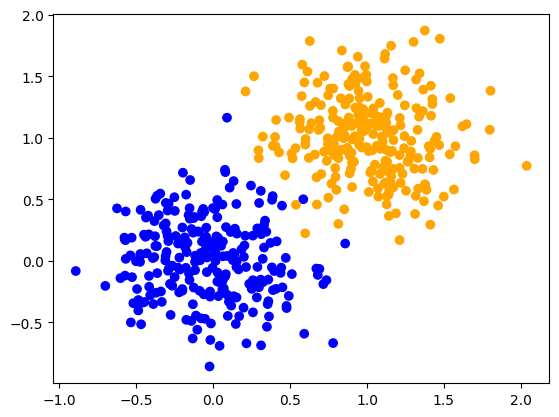

In [5]:
from matplotlib import pyplot as plt
from matplotlib import colors

plt.scatter(X[:, 0], X[:, 1],  c=Y, cmap=colors.ListedColormap(['orange', 'blue']))
plt.show()

# Classification model

Now let us assume a linear decision boundary. That is, our classification model has the form $w^T x$. Let our classifier be the following:

$$f(x; w,b) = \begin{cases}1, & w^Tx + b \ge 0 \\ 0, & \mathrm{otherwise} \end{cases}$$

Before starting to play with the classifer, let's write a helper plot function which will plot the decision boundary (and the regions corresponding to classes) on top of data.

In [6]:

# This function plots the given data and the decision regions for the given classifier
def plot_boundary_on_data(X,Y,pred_func):
    # determine canvas borders
    mins = np.amin(X,0);
    mins = mins - 0.1*np.abs(mins);
    maxs = np.amax(X,0);
    maxs = maxs + 0.1*maxs;

    ## generate dense grid
    xs,ys = np.meshgrid(np.linspace(mins[0],maxs[0],300),
            np.linspace(mins[1], maxs[1], 300));


    # evaluate model on the dense grid
    Z = pred_func(np.c_[xs.flatten(), ys.flatten()]);
    Z = Z.reshape(xs.shape)

    # Plot the contour and training examples
    plt.contourf(xs, ys, Z, cmap=plt.cm.Spectral)
    plt.scatter(X[:, 0], X[:, 1], c=Y, s=50,
            cmap=colors.ListedColormap(['red', 'blue']))
    plt.show()




Let's set $w=[1\;0]$ and $b=0.5$, and see how it classifies the examples. Try other values for $w$ and $b$.

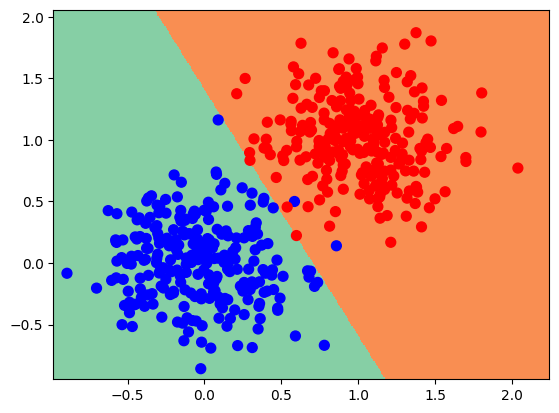

Percent correctly classified examples: 99.60%


In [7]:
w = -np.array([1,.5])
b = +0.7

# classifier
def f(x,w,b):
    return np.dot(x,w)+b>=0

plot_boundary_on_data(X, Y, lambda x: f(x,w,b))

print("Percent correctly classified examples: %.2f%%" % (100*np.mean(f(X,w,b)==Y)))

Obviously, we cannot do this search by hand. Let us try to automate the search. We need to write a loss function and we will try to minimize it.

In [8]:
# This is the 0-1 loss function
def loss01(X,Y,w,b):
    return np.sum(f(X,w,b)!=Y)




We need to find the values of $w$ and $b$ such that the cost should be minimized. Let's do a random search.

Loss: 4


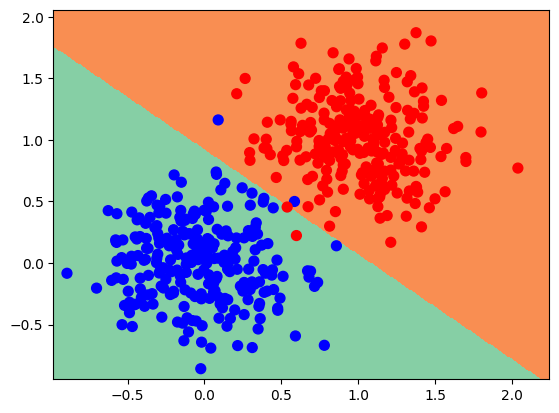

In [9]:
min_loss_value = np.inf
for i in range(1000):
    # randomly pick w and b
    w = (3*np.random.rand(2))-1.5
    b = np.random.rand(1)-.5

    l = loss01(X,Y,w,b[0])
    if l<min_loss_value:
        min_loss_value = l
        best_w = w
        best_b = b

print("Loss: %d" % min_loss_value)
plot_boundary_on_data(X, Y, lambda x: f(x,best_w,best_b))

# The hinge loss

The 0-1 loss is not differentiable, therefore we cannot use its derivative to guide our search.

The hinge loss is a tight, convex upper bound on the 0-1 loss.

To see this, let's plot both loss functions.

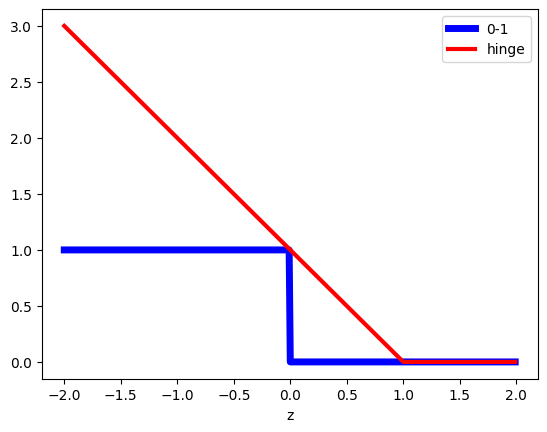

In [10]:
def zeroone(z):
    y = np.zeros(np.size(z))
    y[z<=0] = 1
    return y


z = np.arange(-2,2,.01)
plt.xlabel('z')
plt.plot(z,zeroone(z),'b', linewidth=5, label='0-1')
plt.plot(z,np.maximum(0,1-z),'r', linewidth=3, label='hinge')
plt.legend()
plt.show()

Do you remember the $z$ variable from our lecture? For binary (two-class) classification (where the labels are $-1$ and $+1$), the $z$ is the multiplication of the label with the raw classifier output. That is, in our case,

$$z = y \cdot (w^T x + b)$$

# Derivative of hinge

Hinge loss is not differentiable at z=1. So, we'll use its subgradient (or subderivative). You can find this in the lecture slides.

Hinge loss for an example pair $(x,y)$ is

$$h(x,y;w,b) = \mathrm{max}(0,1 - y(w^Tx +b))$$

Its (sub)gradients are

$$\nabla_w h(x,y;w,b) = \begin{cases} -yx &,  \mathrm{if}\;\;1 - y(w^Tx +b)>0 \\ 0 &, \mathrm{otherwise} \end{cases}$$

$$\nabla_b h(x,y;w,b) = \begin{cases} -y &,  \mathrm{if}\;\;1 - y(w^Tx +b)>0 \\ 0 &, \mathrm{otherwise} \end{cases}$$

Implementation follows below. For this to work, we need to make the labels +1 and -1. (They were 0 and 1 before)

In [11]:
Y[Y==0] = -1

def gradient(X,Y,w,b):
    grad_w = np.zeros(np.shape(X))
    grad_b = np.zeros(np.shape(X)[0])
    for i in range(np.shape(X)[0]):
        score = 1 - Y[i]*(np.dot(X[i,:],w)+b)

        if score>0:
            grad_w[i,:] = -1*Y[i]*X[i,:]
            grad_b[i]   = -1*Y[i]

    grad_w = np.sum(grad_w, axis=0)
    grad_b = np.sum(grad_b)

    return grad_w, grad_b



Now let us write the simple gradient descent code.

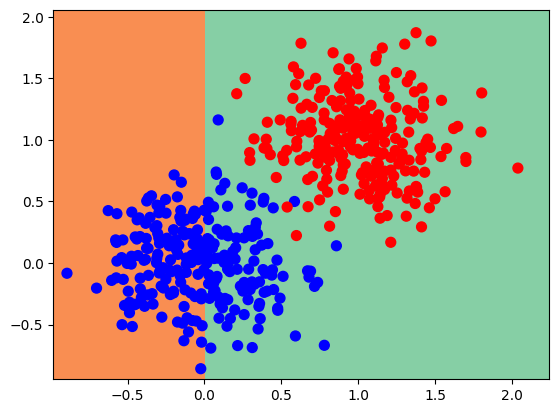

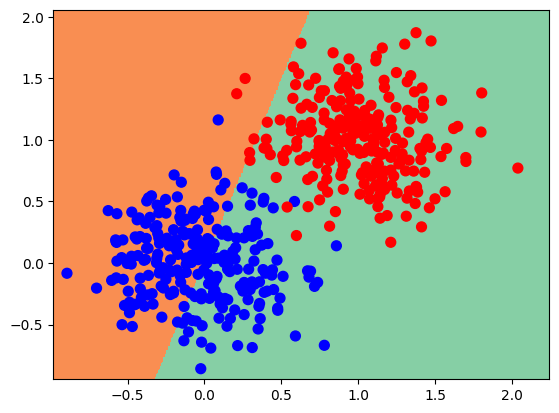

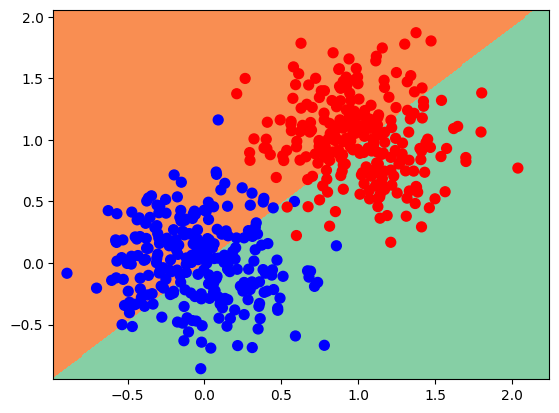

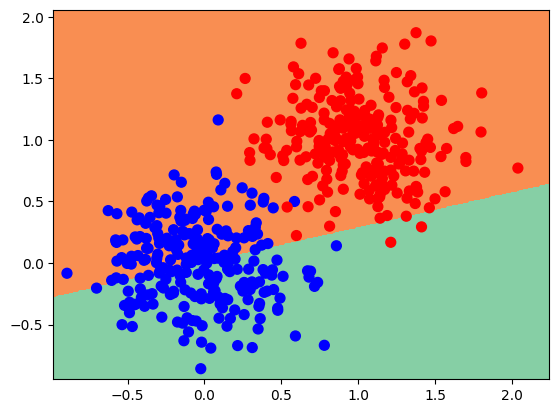

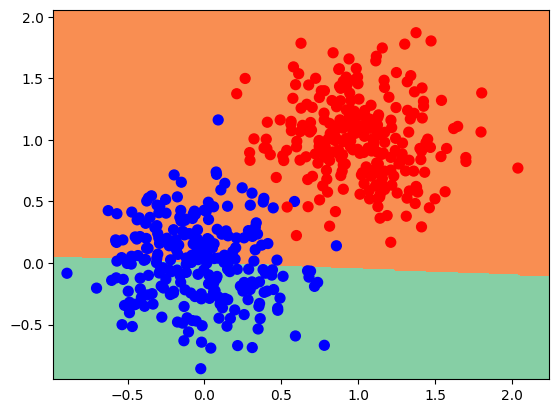

...

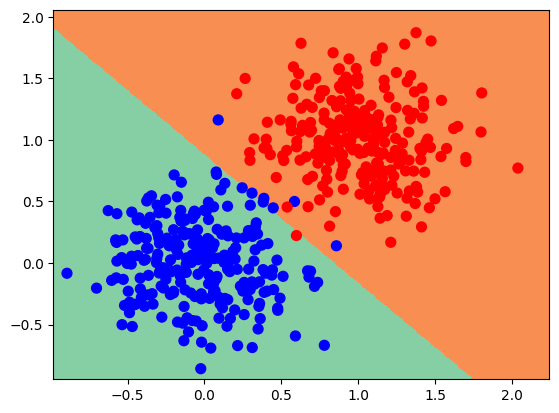

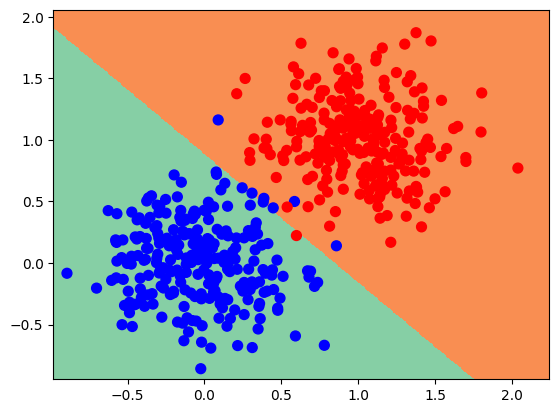

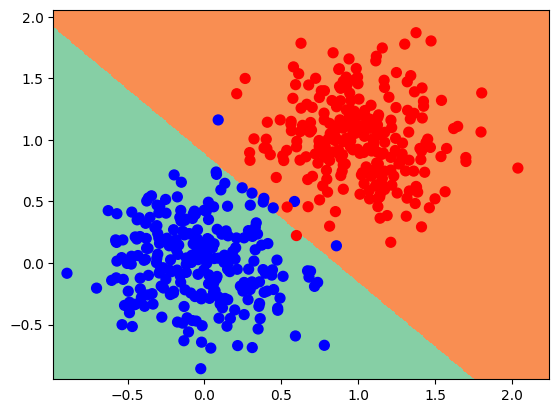

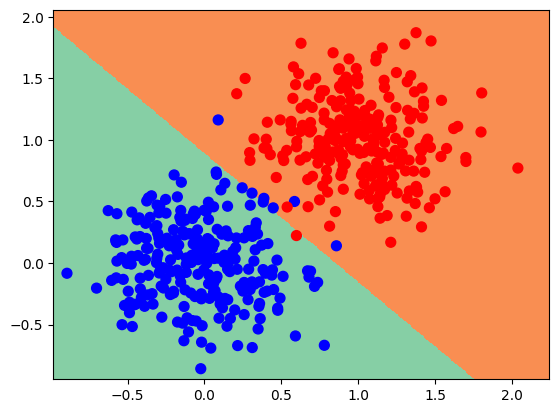

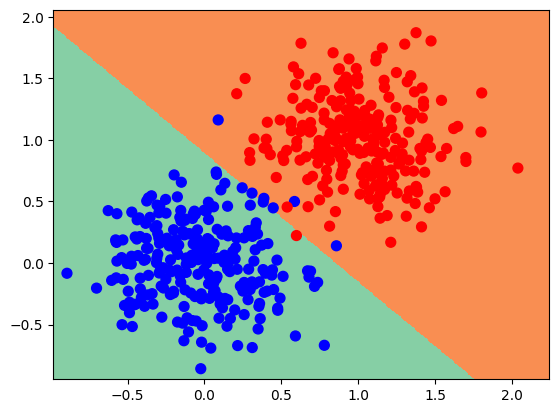

Loss: 75


In [18]:
def minimize_hinge_loss(X,Y,w0,b0, eta=0.001):
    w = w0
    b = b0

    num_steps = 100

    for i in range(num_steps):
        plot_boundary_on_data(X, Y, lambda x: f(x,w,b))

        # compute the gradient
        gw,gb = gradient(X,Y,w,b)

        # take a small step
        w = w - eta*gw
        b = b - eta*gb

    return w, b



w0 = np.array([.1,0])
b0 = 0
w,b = minimize_hinge_loss(X,Y,w0,b0,.0001)
plot_boundary_on_data(X, Y, lambda x: f(x,w,b))
hinge_loss = sum([max(0,1-Y[i]*(np.dot(X[i,:],w)+b)) for i in range(np.shape(X)[0])])
print("Loss: %d" % hinge_loss)

**Exercise:** Add the term $\frac{1}{2}||w||_2^2$ to the cost function. With this, you would have implemented your own linear SVM.

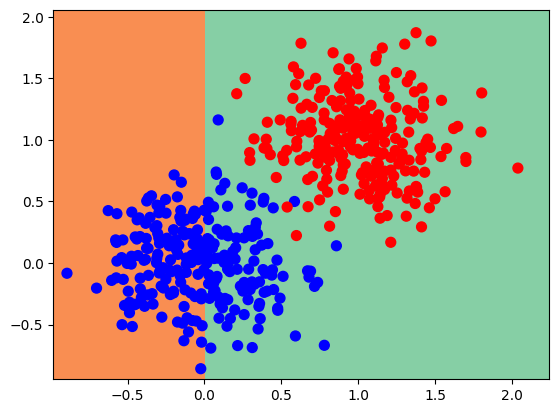

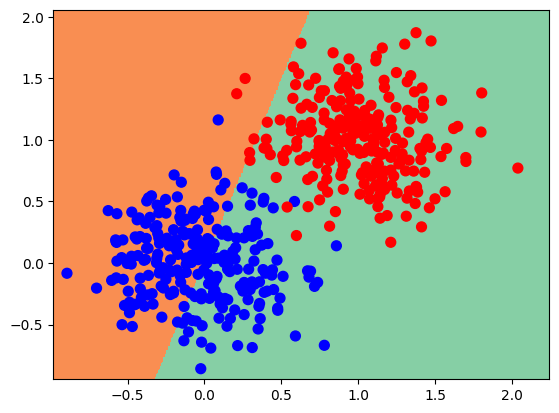

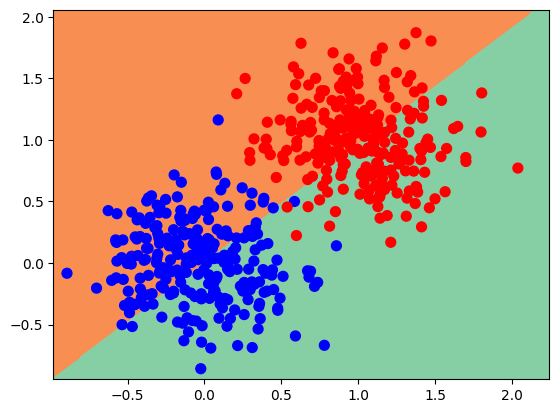

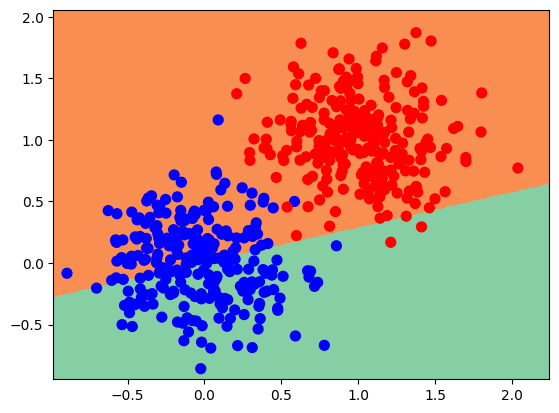

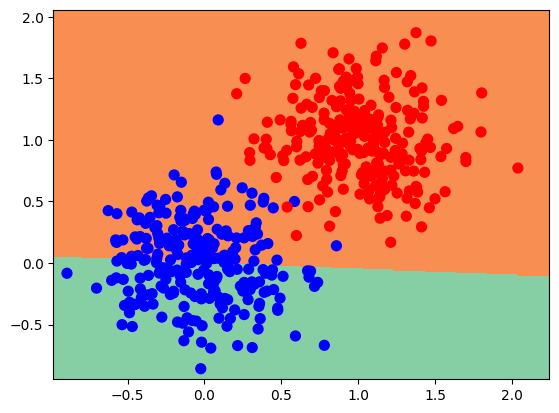

...

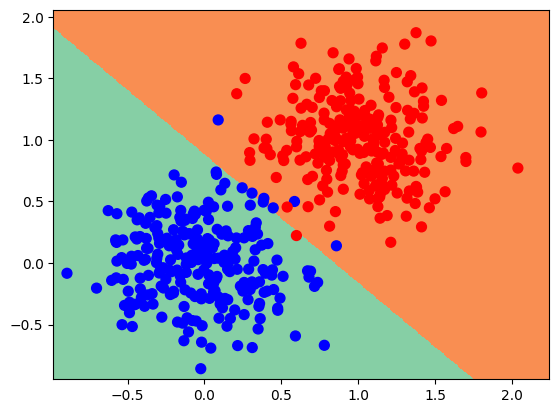

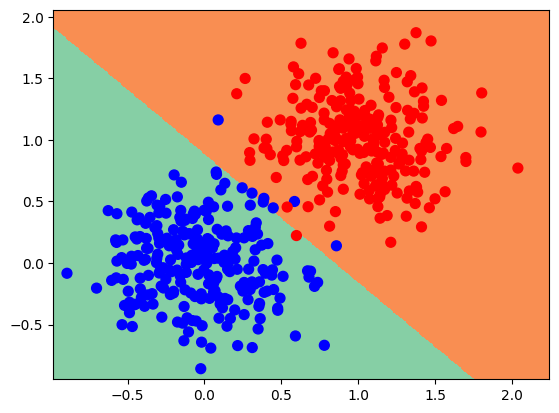

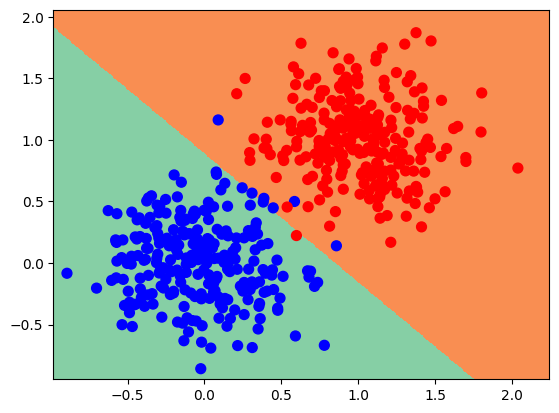

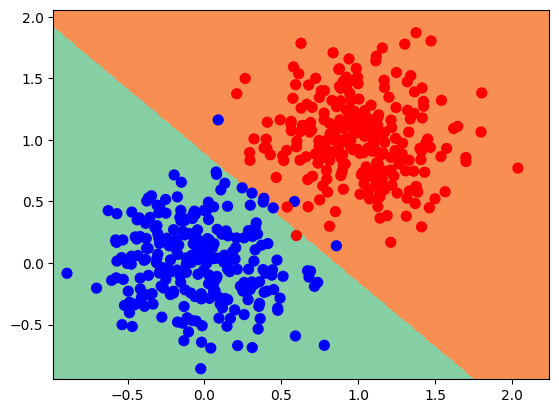

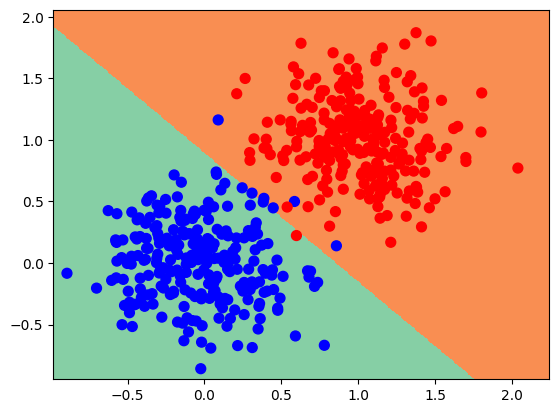

Loss: 77


In [20]:
def minimize_hinge_loss(X,Y,w0,b0, eta=0.001, C=1.0):
    w = w0
    b = b0

    num_steps = 100

    for i in range(num_steps):
        plot_boundary_on_data(X, Y, lambda x: f(x,w,b))

        # compute the gradient
        gw = w + C*gradient(X,Y,w,b)[0]
        gb = C*gradient(X,Y,w,b)[1]

        # take a small step
        w = w - eta*gw
        b = b - eta*gb

    return w, b



w0 = np.array([.1,0])
b0 = 0
w,b = minimize_hinge_loss(X,Y,w0,b0,.0001,1.0)
plot_boundary_on_data(X, Y, lambda x: f(x,w,b))
hinge_loss_l2_reg = 0.5 * w @ w + sum([max(0,1-Y[i]*(np.dot(X[i,:],w)+b)) for i in range(np.shape(X)[0])])
print("Loss: %d" % hinge_loss_l2_reg)